In [1]:
# Import required libraries

from __future__ import print_function
import torch
import torchvision
import matplotlib.pyplot as plt
import numpy as np
import cv2
import torch.nn.functional as F
import kincnn

In [2]:
path = '/home/hb/python/efficientnet_kincnn/4fold_best_model.pth'
_checkpoint = torch.load(path, map_location='cpu')
model = _checkpoint['model']
model.load_state_dict(_checkpoint['state_dict'])
model = model.cuda().eval()
print(model)

EfficientNet(
  (_conv_stem): Conv2dStaticSamePadding(
    1, 8, kernel_size=(3, 1), stride=(1, 1), bias=False
    (static_padding): ZeroPad2d((0, 0, 1, 1))
  )
  (_bn0): BatchNorm2d(8, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
  (_max_pooling): MaxPool2dStaticSamePadding(
    kernel_size=(2, 1), stride=(2, 1), padding=0, dilation=[1, 1], ceil_mode=False
    (static_padding): ZeroPad2d((0, 0, 0, 1))
  )
  (_blocks): ModuleList(
    (0): MBConvBlock(
      (_depthwise_conv_non_padding): Conv2d(8, 8, kernel_size=(5, 1), stride=(1, 1), groups=8, bias=False)
      (_bn1): BatchNorm2d(8, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
      (_se_reduce): Conv2dStaticSamePadding(
        8, 2, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_se_expand): Conv2dStaticSamePadding(
        2, 8, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_projec

In [3]:
from collections import namedtuple
GradCamSave = namedtuple('GradCamSave', ['activations', 'gradients'])
value = dict()

def forward_hook(module, input, output):
    output = model._swish(output)
    value['activations'] = output # forward_hook이 호출되면 value['activations']에 output을 저장

def backward_hook(module, input, output):
    value['gradients'] = output[0]

target_layer = model._bn1
target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)

In [4]:
# import pandas as pd

# df1 = pd.read_pickle("/home/hb/python/phospho/data/required/0308_final_train_test/train3.pkl")
# df2 = pd.read_pickle("/home/hb/python/phospho/data/required/0308_final_train_test/test3.pkl")
# df1['type'] = 'train3'
# df2['type'] = 'test3'
# df = pd.concat([df1, df2]).reset_index(drop=True)

# kinmap = pd.read_csv("/home/hb/python/efficientnet_kincnn/kinase_family_kinmap.csv")
# from collections import namedtuple
# KINMAPDICT = namedtuple('KINMAPDICT', ['Name', 'Family', 'Group'])
# kinmap_dict = {_id: KINMAPDICT(_name, _family, _group) for _id, _family, _group, _name in zip(kinmap.UniprotID, kinmap.Family, kinmap.Group, kinmap.xName)}

# df_family = df['kin_id'].apply(lambda x: kinmap_dict[x].Family if x in kinmap_dict.keys() else None)
# df_group = df['kin_id'].apply(lambda x: kinmap_dict[x].Group if x in kinmap_dict.keys() else None)
# df_name = df['kin_id'].apply(lambda x: kinmap_dict[x].Name if x in kinmap_dict.keys() else None) 
# df.insert(1, 'Name', df_name)
# df.insert(2, 'Family', df_family)
# df.insert(3, 'Group', df_group)
# print(len(df))
# # df2 = df[df['type'=='test3']]
# # df1 = df[df['type'=='train3']]

# # df1.to_pickle("/home/hb/python/phospho/data/required/0308_final_train_test/train3.pkl")
# df.to_pickle("/home/hb/python/phospho/data/required/0308_final_train_test/dataset3.pkl")

In [5]:
import pandas as pd
df = pd.read_pickle("/home/hb/python/efficientnet_kincnn/dataset3.pkl")

In [6]:
from collections import namedtuple
GradCamSave = namedtuple('GradCamSave', ['family', 'group', 'grad_cam', 'grad_cam_pp'])
value = dict()

def forward_hook(module, input, output):
    output = model._swish(output)
    # value['input'] = input
    value['activations'] = output # forward_hook이 호출되면 value['activations']에 output을 저장

def backward_hook(module, input, output):
    value['gradients'] = output[0]

target_layer = model._bn1
target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)

In [7]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"  # Arrange GPU devices starting from 0
os.environ["CUDA_VISIBLE_DEVICES"]= "2"  # Set the GPU 2 to use
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print('Device:', device)
print('Current cuda device:', torch.cuda.current_device())
print('Count of using GPUs:', torch.cuda.device_count())


Device: cuda
Current cuda device: 0
Count of using GPUs: 4


In [8]:
grad_cam_result = pd.DataFrame(columns=['pair', 'family', 'group', 'grad_cam', 'grad_cam_pp'])
grad_cam_result

,pair,family,group,grad_cam,grad_cam_pp


In [9]:
grad_cam_result = pd.DataFrame(columns=['pair', 'family', 'group', 'grad_cam', 'grad_cam_pp'])
# ddf = df.iloc[7771:]
ddf = df
for _pair, _matrix, _family, _group in zip(ddf['pair'], ddf['matrix'], ddf['Family'], ddf['Group']):
    try: 
        in_tensor = torch.tensor(_matrix).unsqueeze_(0).requires_grad_(True).cuda()
        output = model(in_tensor)
        target_index = np.argmax(output.data.cpu().numpy())
        output[:,target_index].sum().backward(retain_graph=True)
        layer4 = value['activations'] # [1, 512, 7, 7]
        gradient = value['gradients'] # [1, 512, 7, 7]
        g = torch.mean(gradient, dim=(2, 3), keepdim=True) # [1, 512, 1, 1]

        grad_cam = layer4 * g # [1, 512, 7, 7]
        grad_cam = torch.sum(grad_cam, dim=(0,1)) # [7, 7]
        grad_cam = torch.clamp(grad_cam,min = 0) # [7, 7]

        g_2 = gradient**2 
        g_3 = gradient**3 
        alpha_numer = g_2 
        alpha_denom = 2*g_2 + torch.sum(layer4*g_3,axis=(2,3),keepdims=True)

        alpha = alpha_numer/ alpha_denom

        w = torch.sum(alpha*torch.clamp(gradient, min = 0),axis=(2,3),keepdims=True)

        grad_cam_pp = layer4 * w 
        grad_cam_pp = torch.sum(grad_cam_pp, dim=(0,1))
        grad_cam_pp = torch.clamp(grad_cam_pp,min = 0)
        grad_cam = grad_cam.cpu().detach().numpy()
        grad_cam_pp = grad_cam_pp.cpu().detach().numpy()
        
        df_result = pd.DataFrame([[_pair, _family, _group, grad_cam, grad_cam_pp]], columns=['pair', 'family', 'group', 'grad_cam', 'grad_cam_pp'])
        grad_cam_result = pd.concat([grad_cam_result, df_result])
        # grad_cam_result[_pair] = GradCamSave(_family, _group, grad_cam, grad_cam_pp)
    except Exception as e:
        print("에러 발생:", e)
        print(len(grad_cam_result.keys()))
        display(df[df['pair'].isin(grad_cam_result.keys())].tail(2))
        break

/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([

/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])
torch.Size([1, 8, 9, 15])


/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/home/hb/anaconda3/envs/phos/lib/python3.10/site-packages/torch/nn/modules/module.py:1117: Use

In [10]:
grad_cam_result = grad_cam_result.sort_values(by=['family']).reset_index(drop=True)
grad_cam_result

,pair,family,group,grad_cam,grad_cam_pp
0,Q9UM73_RVCSLCYRELAAQ,ALK,TK,"[[0.0, 0.0, 0.0, 0.0, 0.000373999, 0.0, 0.0, 0...","[[0.0205638, 0.05325572, 0.06773758, 0.1056384..."
1,Q9UM73_GLARDIYKDPDYV,ALK,TK,"[[0.0, 0.00014063294, 0.0, 0.00013235305, 0.0,...","[[0.033400796, 0.0, 0.09327865, 0.0, 0.0822797..."
2,Q9UM73_YRPSYSYDYEFDL,ALK,TK,"[[0.0, 0.0, 0.0, 0.0, 3.9635444e-05, 0.0, 3.96...","[[0.0, 0.0, 0.0, 0.0, 0.11245741, 0.0, 0.11245..."
3,P29376_RRAPELYRAPFPL,ALK,TK,"[[0.0, 0.0, 0.0, 7.2841503e-06, 0.0001283738, ...","[[0.0625958, 0.0625958, 0.0625958, 0.0, 0.0, 0..."
4,Q9UM73_KQVEELYHSLLEL,ALK,TK,"[[0.0, 0.0, 0.0, 0.0, 0.00044131308, 0.0004413...","[[0.0, 0.109487526, 0.0, 0.114758596, 0.116214..."
...,...,...,...,...,...
21156,Q9UQ88_DSEVDSSCSGQPI,None,None,"[[0.00061699754, 0.0, 0.0017489752, 0.00221515...","[[0.24851722, 0.38344604, 0.41341472, 0.775953..."
21157,Q9UQ88_EESWTDSEVDSSC,None,None,"[[0.0016702759, 0.0014621471, 0.0014621471, 0....","[[0.14505571, 0.14524333, 0.14524333, 0.145055..."
21158,Q9UQ88_ALSRQLSSGVSEI,None,None,"[[0.0, 0.0, 0.0, 0.0008654306, 0.0, 0.00108072...","[[0.0, 0.0, 0.0, 0.052681495, 0.0, 0.16338809,..."
21159,Q9UQ88_SLSTHTSPSQSPN,None,None,"[[0.0020721923, 0.0021066961, 0.0, 0.002106696...","[[0.27401507, 0.17803049, 0.0, 0.17803049, 0.0..."


In [14]:
grad_cam_result['grad_cam_resize'] = grad_cam_result['grad_cam'].apply(lambda x: cv2.resize(x, (263, 15)))
grad_cam_result['grad_cam_pp_resize'] = grad_cam_result['grad_cam_pp'].apply(lambda x: cv2.resize(x, (263, 15)))

In [12]:
ma = grad_cam_result.grad_cam[0]
# ma = grad_cam.data.cpu().numpy()
ma = cv2.resize(ma, (263, 15))

In [13]:
ma

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.00026959, 0.00026959, 0.00026959, ..., 0.        , 0.        ,
        0.        ],
       [0.00010783, 0.00010783, 0.00010783, ..., 0.00021016, 0.00021016,
        0.00021016],
       [0.        , 0.        , 0.        , ..., 0.00035027, 0.00035027,
        0.00035027]], dtype=float32)

In [28]:
A = np.arange(6).reshape(2, 3)
A

array([[0, 1, 2],
       [3, 4, 5]])

In [29]:
A.mean(axis=0)

array([1.5, 2.5, 3.5])

In [25]:
grad_cam_result.family.value_counts()

MAPK     3056
CDK      2907
Src      1959
PKA      1371
CK2      1200
         ... 
DDR         4
Tie         4
MAST        2
STK33       2
IRE         2
Name: family, Length: 82, dtype: int64

In [ ]:
grad_cam_result

In [ ]:
# in_tensor = df['matrix'][0]
# in_tensor = torch.tensor(in_tensor)
# in_tensor = in_tensor.unsqueeze_(0)
# in_tensor = in_tensor.requires_grad_(True)
# in_tensor = in_tensor.cuda()

# output = model(in_tensor)
# target_index = np.argmax(output.data.cpu().numpy())

# output[:,target_index].sum().backward(retain_graph=True)
# layer4 = value['activations'] # [1, 512, 7, 7]
# gradient = value['gradients'] # [1, 512, 7, 7]
# g = torch.mean(gradient, dim=(2, 3), keepdim=True) # [1, 512, 1, 1]

# grad_cam = layer4 * g # [1, 512, 7, 7]
# grad_cam = torch.sum(grad_cam, dim=(0,1)) # [7, 7]
# grad_cam = torch.clamp(grad_cam,min = 0) # [7, 7]

# g_2 = gradient**2 
# g_3 = gradient**3 
# alpha_numer = g_2 
# alpha_denom = 2*g_2 + torch.sum(layer4*g_3,axis=(2,3),keepdims=True)

# alpha = alpha_numer/ alpha_denom

# w = torch.sum(alpha*torch.clamp(gradient, min = 0),axis=(2,3),keepdims=True)

# grad_cam_pp = layer4 * w 
# grad_cam_pp = torch.sum(grad_cam_pp, dim=(0,1))
# grad_cam_pp = torch.clamp(grad_cam_pp,min = 0)

/home/hb/anaconda3/envs/pp/lib/python3.11/site-packages/torch/nn/modules/module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


In [ ]:
from sklearn.decomposition import PCA
# import seaborn as sns

pca1 = PCA(n_components=2)
X = torch.tensor.detach().numpy()
X_low = pca1.fit_transform(X)
X2 = pca1.inverse_transform(X_low)

# plt.figure(figsize=(7, 7))
# ax = sns.scatterplot(0, 1, data=pd.DataFrame(X), s=100, color=".2", marker="s")
# for i in range(N):
#     d = 0.03 if X[i, 1] > X2[i, 1] else -0.04
#     ax.text(X[i, 0] - 0.065, X[i, 1] + d, "표본 {}".format(i + 1))
#     plt.plot([X[i, 0], X2[i, 0]], [X[i, 1], X2[i, 1]], "k--")
# plt.plot(X2[:, 0], X2[:, 1], "o-", markersize=10)
# plt.plot(X[:, 0].mean(), X[:, 1].mean(), markersize=10, marker="D")
# plt.axvline(X[:, 0].mean(), c='r')
# plt.axhline(X[:, 1].mean(), c='r')
# plt.grid(False)
# plt.xlabel("꽃받침 길이")
# plt.ylabel("꽃받침 폭")
# plt.title("Iris 데이터의 1차원 차원축소")
# plt.axis("equal")
# plt.show()

AttributeError: 'builtin_function_or_method' object has no attribute 'detach'

In [ ]:
output[:,target_index].sum().backward(retain_graph=True)
layer4 = value['activations'] # [1, 512, 7, 7]
gradient = value['gradients'] # [1, 512, 7, 7]
g = torch.mean(gradient, dim=(2, 3), keepdim=True) # [1, 512, 1, 1]

grad_cam = layer4 * g # [1, 512, 7, 7]
grad_cam = torch.sum(grad_cam, dim=(0,1)) # [7, 7]
grad_cam = torch.clamp(grad_cam,min = 0) # [7, 7]

g_2 = gradient**2 
g_3 = gradient**3 
alpha_numer = g_2 
alpha_denom = 2*g_2 + torch.sum(layer4*g_3,axis=(2,3),keepdims=True)

alpha = alpha_numer/ alpha_denom

w = torch.sum(alpha*torch.clamp(gradient, min = 0),axis=(2,3),keepdims=True)

grad_cam_pp = layer4 * w 
grad_cam_pp = torch.sum(grad_cam_pp, dim=(0,1))
grad_cam_pp = torch.clamp(grad_cam_pp,min = 0)

In [ ]:
grad_cam = grad_cam.data.cpu().numpy()
grad_cam = cv2.resize(grad_cam, (263, 15))

grad_cam_pp = grad_cam_pp.data.cpu().numpy()
grad_cam_pp = cv2.resize(grad_cam_pp, (263, 15))

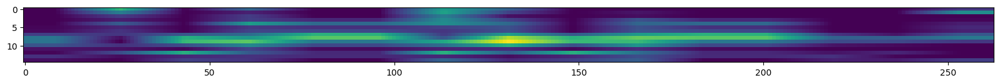

In [ ]:
fig = plt.figure(figsize=(20, 5))
plt.imshow((grad_cam))

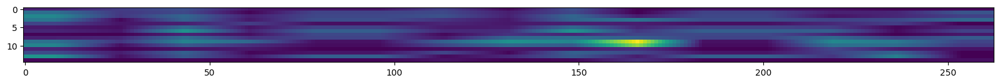

In [ ]:
fig = plt.figure(figsize=(20, 5))
plt.imshow((grad_cam_pp))